In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam


In [2]:
# Define directories
train_dir = './training/training'  # Directory containing train images
val_dir = './validation/validation'

input_shape = (224, 224)  # VGG16 input shape

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

rescale_factor = 1.0 / 224.0


# Instantiate the ImageDataGenerator for training data
train_datagen = ImageDataGenerator(rescale=rescale_factor)

# Instantiate the ImageDataGenerator for validation data
validation_datagen = ImageDataGenerator(rescale=rescale_factor)


In [4]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=input_shape,
    batch_size=32,
    class_mode='categorical'
)

Found 1000 images belonging to 2 classes.


In [5]:
validation_generator = validation_datagen.flow_from_directory(
    val_dir,
    target_size=input_shape,
    batch_size=32,
    class_mode='categorical',
)

Found 184 images belonging to 2 classes.


In [6]:
# Load pre-trained VGG16 model without the top (fully connected layers)
# Load pre-trained VGG16 model without the top (fully connected layers)
vgg_base = VGG16(weights='imagenet', include_top=True, input_shape=(224,224,3))

# Freeze VGG16 layers
for layer in vgg_base.layers:
    layer.trainable = False

In [7]:
model = Sequential()

# Add the VGG16 model as the first layer
model.add(vgg_base)

# Flatten the output of VGG16
model.add(Flatten())

# Add dense layers
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))  # Assuming 2 output classes

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 1000)              138357544 
                                                                 
 flatten (Flatten)           (None, 1000)              0         
                                                                 
 dense (Dense)               (None, 512)               512512    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 138,871,082
Trainable params: 513,538
Non-trainable params: 138,357,544
_________________________________________________________________


In [9]:
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
history = model.fit(train_generator, epochs=20, validation_data=validation_generator)

Epoch 1/20
32/32 [==============================] - 280s 9s/step - loss: 0.6764 - accuracy: 0.6430 - val_loss: 0.6110 - val_accuracy: 0.9022
Epoch 2/20
32/32 [==============================] - 261s 8s/step - loss: 0.6281 - accuracy: 0.7730 - val_loss: 0.4994 - val_accuracy: 0.8859
Epoch 3/20
32/32 [==============================] - 267s 8s/step - loss: 0.5610 - accuracy: 0.7820 - val_loss: 0.3987 - val_accuracy: 0.8913
Epoch 4/20
32/32 [==============================] - 258s 8s/step - loss: 0.4984 - accuracy: 0.8020 - val_loss: 0.3333 - val_accuracy: 0.9076
Epoch 5/20
32/32 [==============================] - 258s 8s/step - loss: 0.4460 - accuracy: 0.8190 - val_loss: 0.3096 - val_accuracy: 0.8859
Epoch 6/20
32/32 [==============================] - 257s 8s/step - loss: 0.4177 - accuracy: 0.8230 - val_loss: 0.2976 - val_accuracy: 0.8750
Epoch 7/20
32/32 [==============================] - 227s 7s/step - loss: 0.3816 - accuracy: 0.8410 - val_loss: 0.2816 - val_accuracy: 0.8804
Epoch 8/20
32

In [11]:
# model.save('./flood-model-latest_vgg16-20.h5')

In [14]:
from matplotlib import pyplot as plt

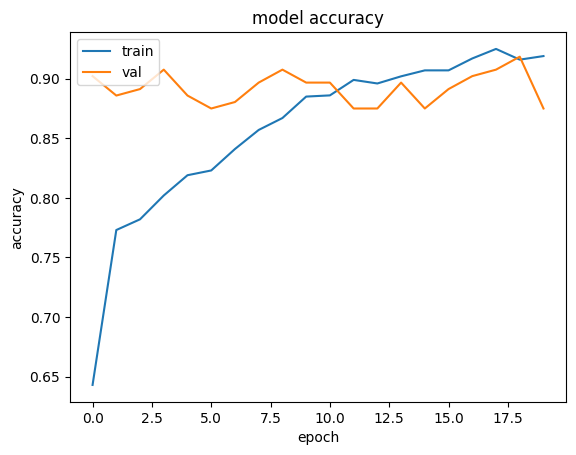

In [15]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

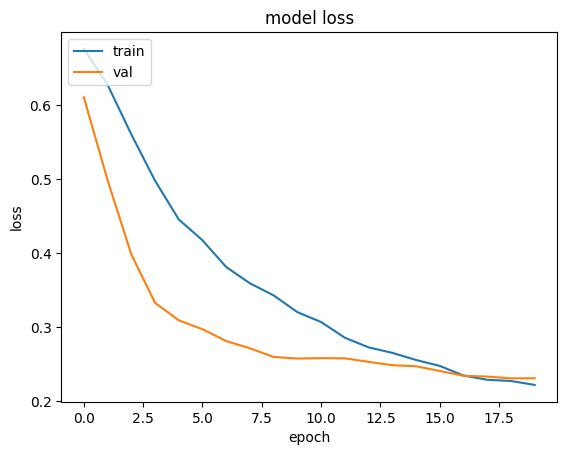

In [16]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [18]:
import pandas as pd

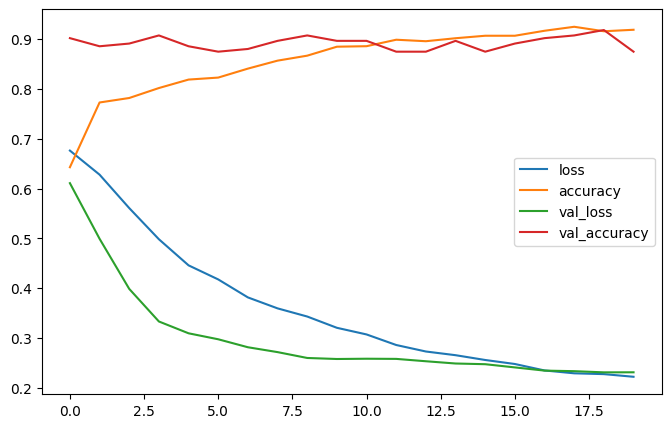

In [19]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [7]:
import keras
model = keras.models.load_model('./flood-model-latest_vgg16-20.h5')

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 1000)              138357544 
                                                                 
 flatten (Flatten)           (None, 1000)              0         
                                                                 
 dense (Dense)               (None, 512)               512512    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 138,871,082
Trainable params: 513,538
Non-trainable params: 138,357,544
_________________________________________________________________


1/1 [==============================] - 0s 406ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.5366119  0.46338812]]


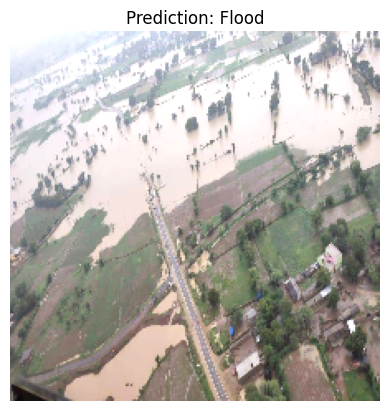

1/1 [==============================] - 0s 133ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.4593799 0.5406201]]


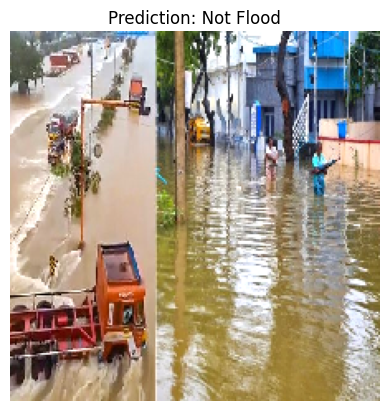

1/1 [==============================] - 0s 145ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9899831  0.01001688]]


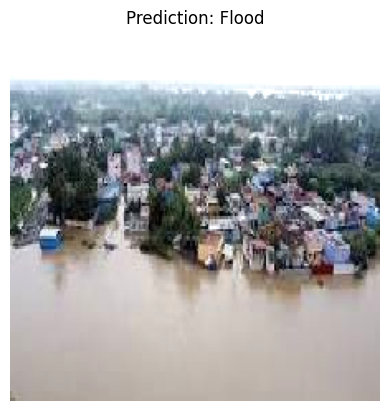

1/1 [==============================] - 0s 172ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.81228244 0.18771757]]


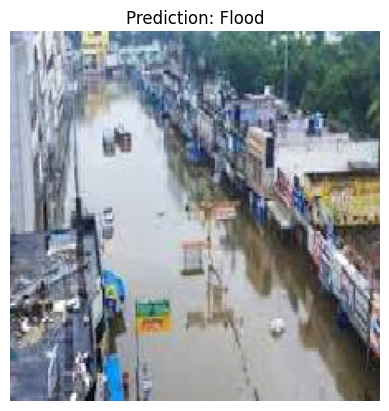

1/1 [==============================] - 0s 136ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.30495527 0.69504464]]


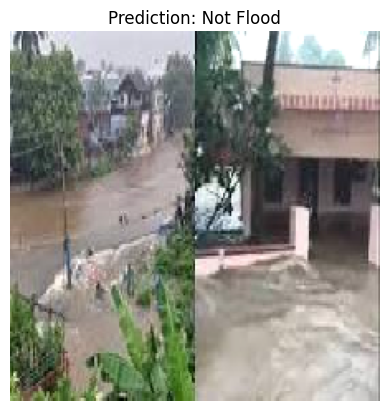

1/1 [==============================] - 0s 134ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.5800011  0.41999897]]


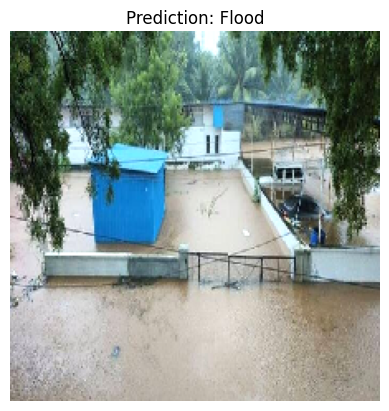

1/1 [==============================] - 0s 133ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.33041424 0.66958576]]


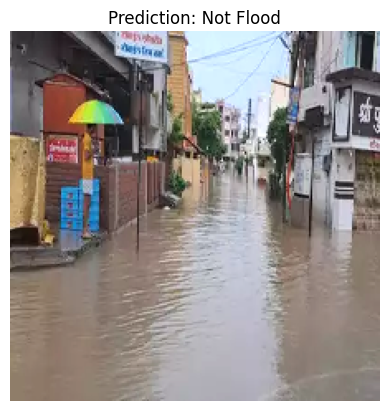

1/1 [==============================] - 0s 166ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.98093545 0.01906452]]


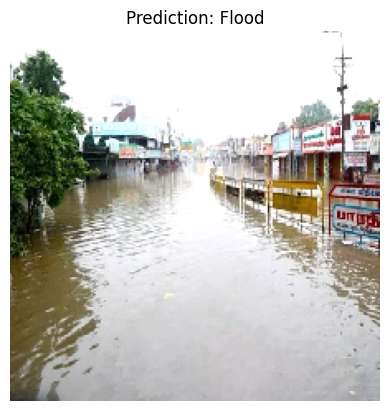

1/1 [==============================] - 0s 135ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.42195973 0.5780403 ]]


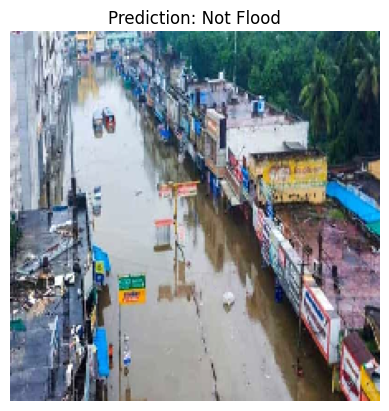

1/1 [==============================] - 0s 145ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.4179634 0.5820366]]


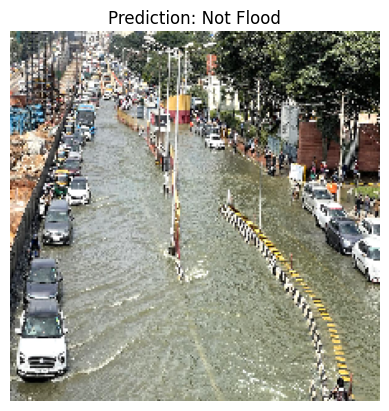

1/1 [==============================] - 0s 166ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.3935135 0.6064865]]


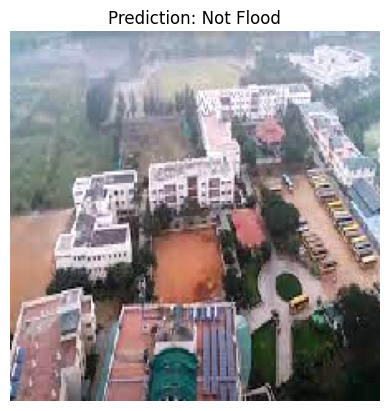

1/1 [==============================] - 0s 131ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.6647791  0.33522084]]


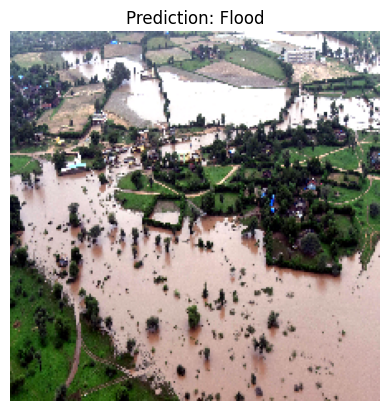

1/1 [==============================] - 0s 152ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.86572397 0.13427608]]


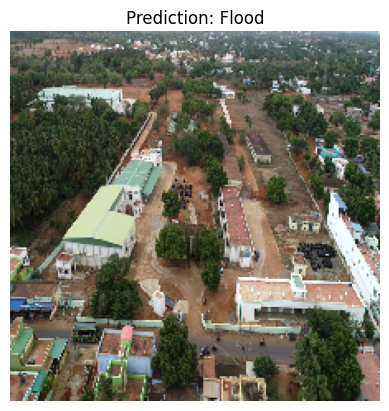

1/1 [==============================] - 0s 143ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9852797  0.01472039]]


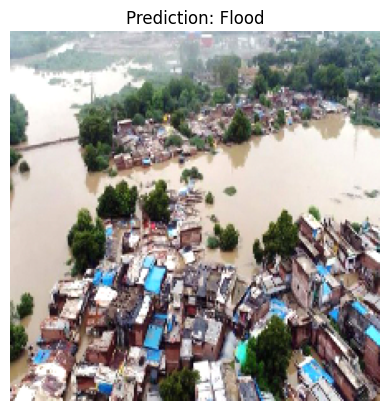

1/1 [==============================] - 0s 187ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.5226572  0.47734275]]


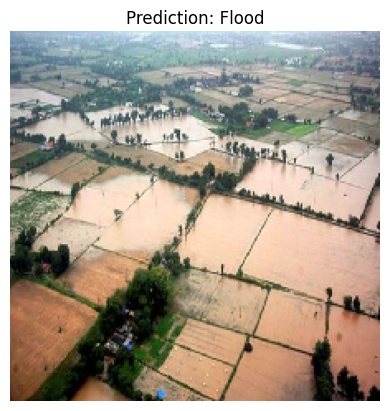

1/1 [==============================] - 0s 134ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.82585615 0.17414391]]


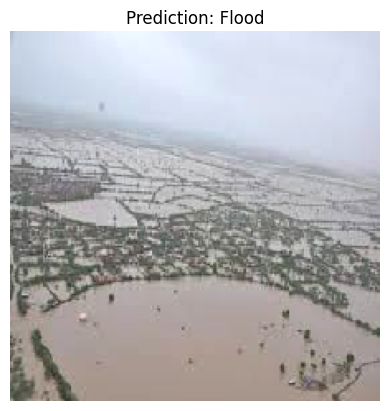

1/1 [==============================] - 0s 181ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.93108803 0.068912  ]]


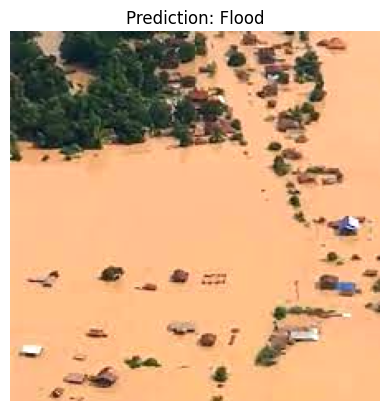

1/1 [==============================] - 0s 151ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.73705196 0.26294807]]


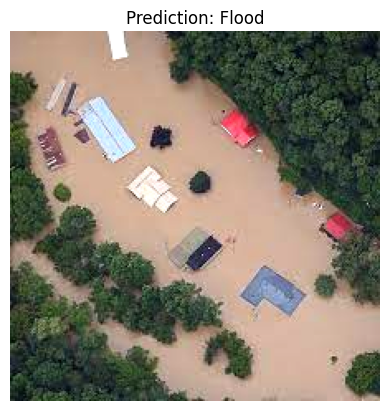

1/1 [==============================] - 0s 146ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9737845  0.02621552]]


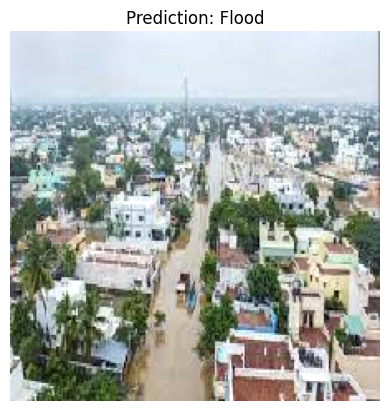

1/1 [==============================] - 0s 140ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.8817008  0.11829925]]


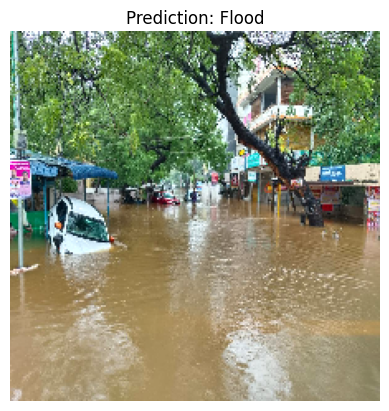

1/1 [==============================] - 0s 208ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9866354  0.01336463]]


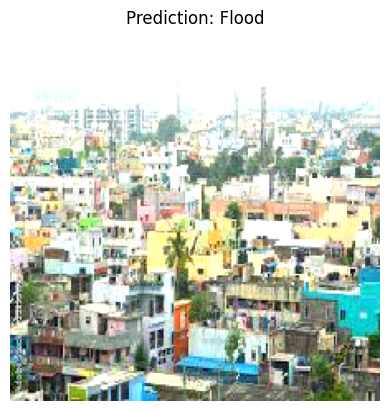

1/1 [==============================] - 0s 133ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.10091288 0.89908713]]


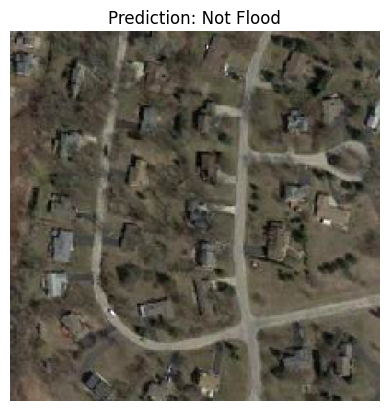

1/1 [==============================] - 0s 141ms/step
[[0.33001888 0.66998106]]


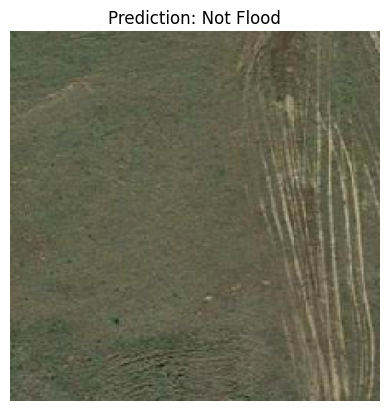

1/1 [==============================] - 0s 134ms/step
[[0.11104943 0.8889506 ]]


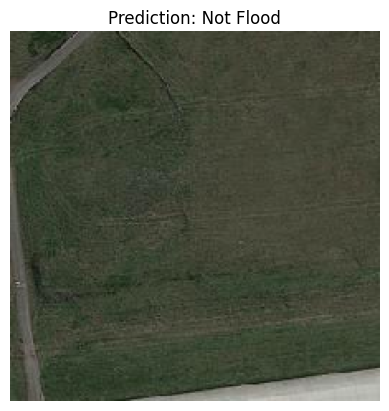

1/1 [==============================] - 0s 152ms/step
[[0.3739141 0.6260859]]


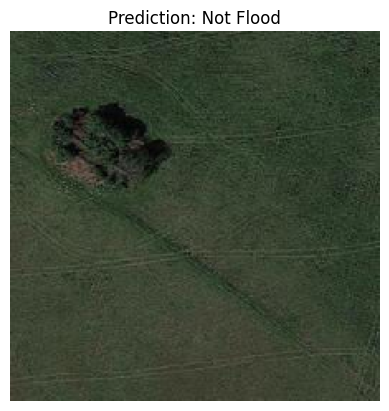

1/1 [==============================] - 0s 149ms/step
[[0.06860368 0.9313963 ]]


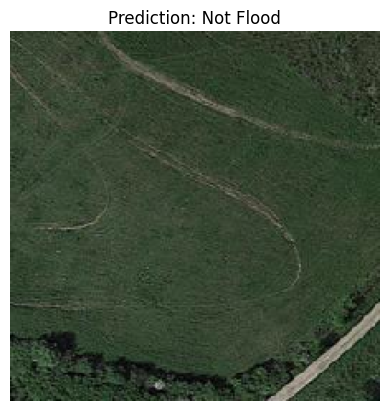

1/1 [==============================] - 0s 142ms/step
[[0.24098831 0.7590117 ]]


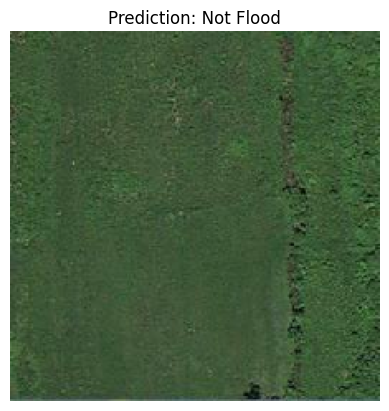

1/1 [==============================] - 0s 152ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.17240103 0.827599  ]]


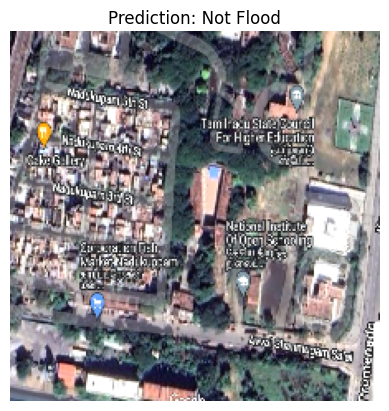

1/1 [==============================] - 0s 188ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.92462975 0.07537031]]


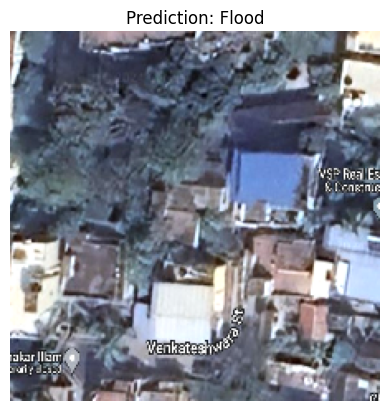

1/1 [==============================] - 0s 178ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9625022  0.03749784]]


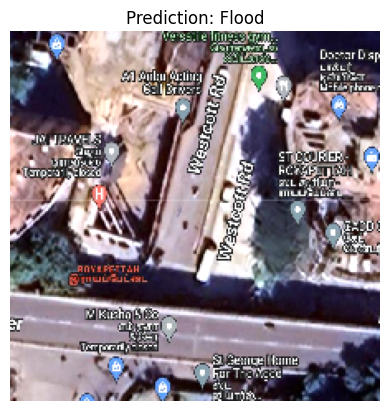

1/1 [==============================] - 0s 169ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.2978729 0.7021271]]


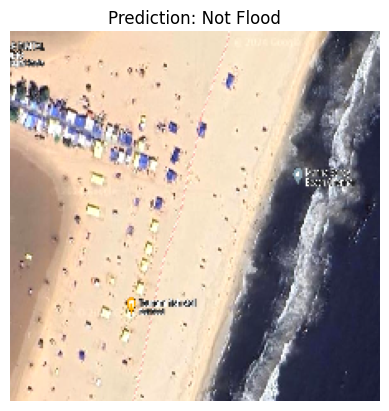

1/1 [==============================] - 0s 131ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9267285  0.07327158]]


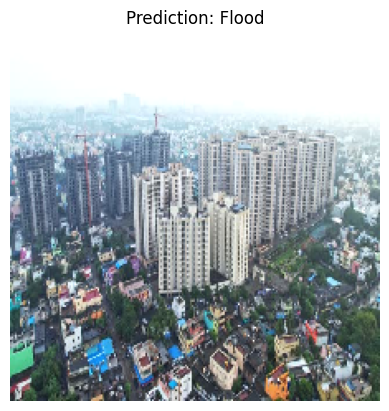

1/1 [==============================] - 0s 163ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.23669018 0.76330984]]


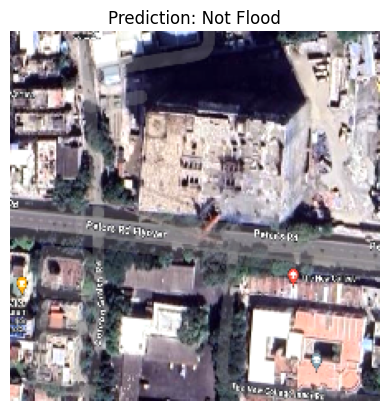

1/1 [==============================] - 0s 142ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.3815541 0.6184458]]


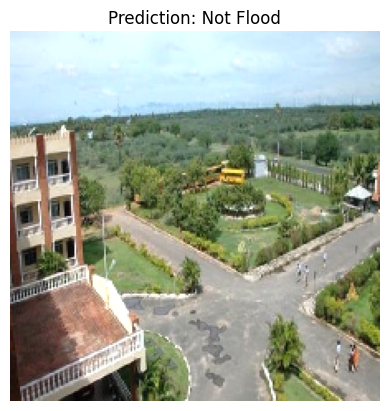

1/1 [==============================] - 0s 164ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.8950849  0.10491508]]


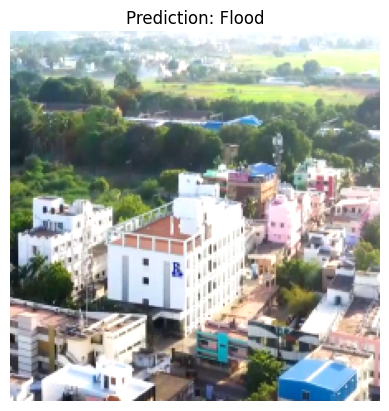

1/1 [==============================] - 0s 186ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.05976098 0.9402391 ]]


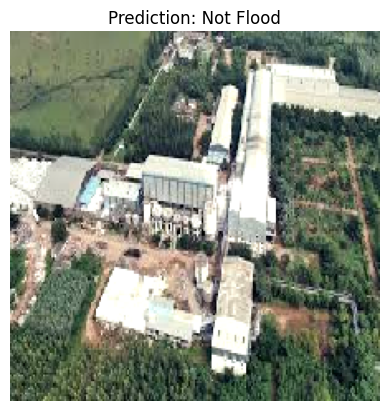

1/1 [==============================] - 0s 207ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.01954847 0.9804515 ]]


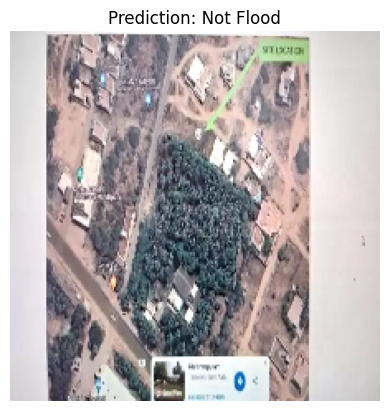

1/1 [==============================] - 0s 158ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.2944184  0.70558167]]


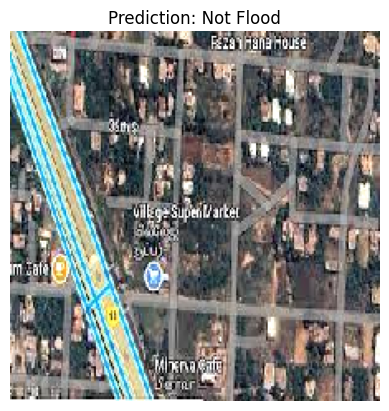

1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.9723122  0.02768784]]


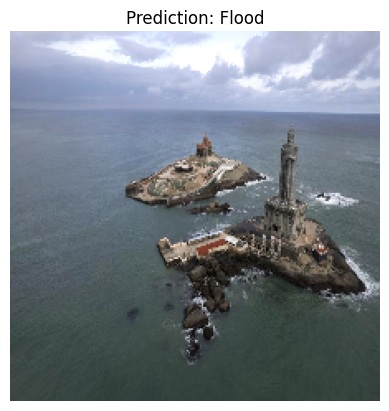

1/1 [==============================] - 0s 155ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.18080944 0.81919056]]


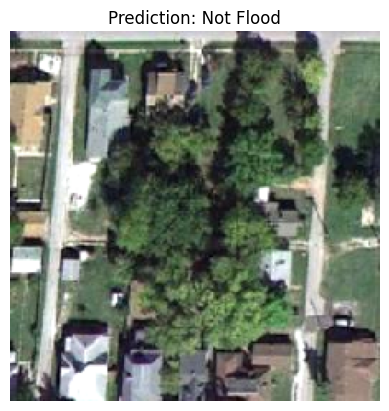

1/1 [==============================] - 0s 165ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.11269209 0.8873079 ]]


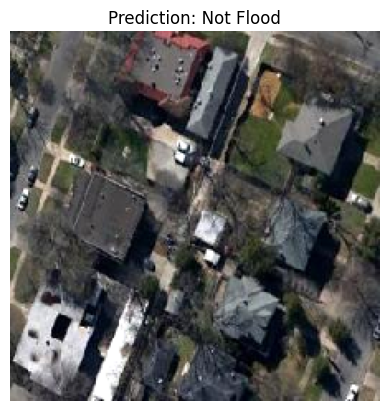

1/1 [==============================] - 0s 148ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.4712947  0.52870536]]


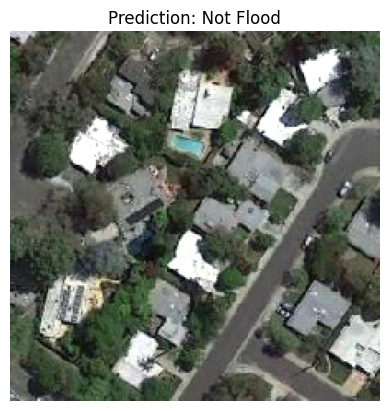

1/1 [==============================] - 0s 175ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.20536397 0.79463595]]


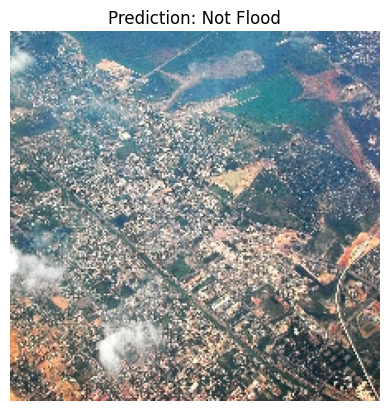

1/1 [==============================] - 0s 178ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.24565145 0.7543486 ]]


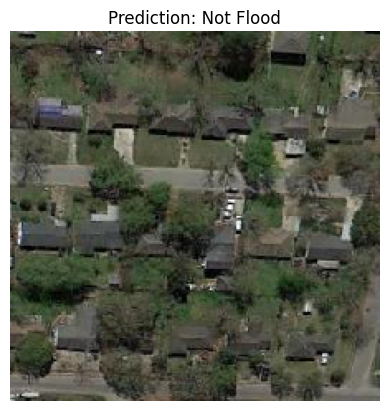

1/1 [==============================] - 0s 187ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.81190985 0.18809015]]


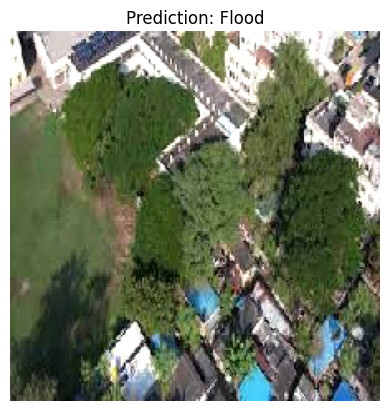

1/1 [==============================] - 0s 172ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.57401294 0.42598706]]


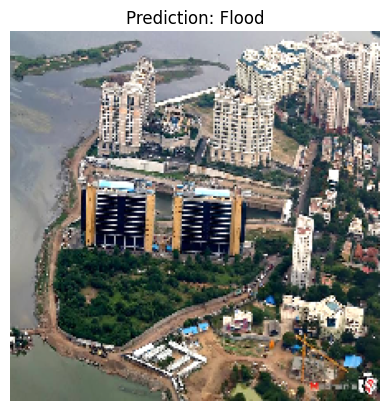

1/1 [==============================] - 0s 191ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.7963291  0.20367089]]


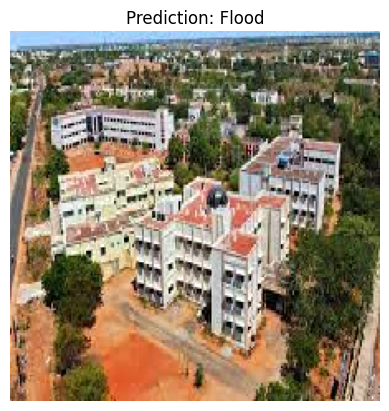

1/1 [==============================] - 0s 191ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.03119258 0.9688074 ]]


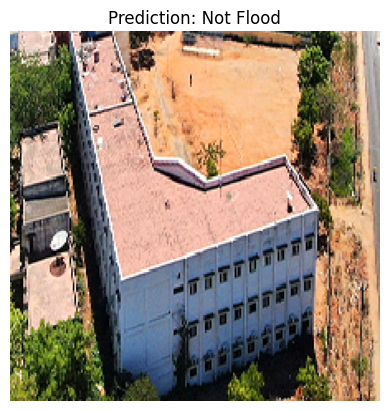

1/1 [==============================] - 0s 255ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.7251514  0.27484864]]


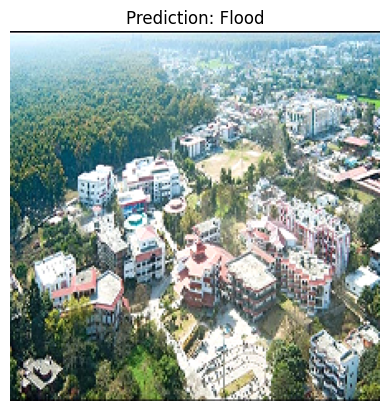

1/1 [==============================] - 0s 216ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[0.96840906 0.03159101]]


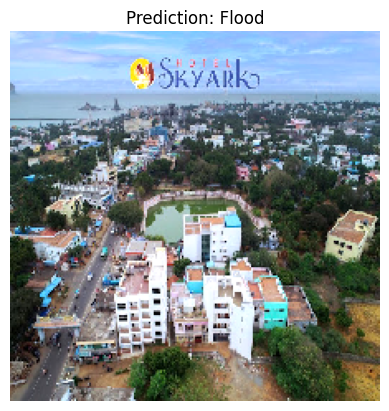

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Define the path to your test data folder
test_data_dir = './testing/testing'

# Get the list of image file names in the test data folder
image_files = os.listdir(test_data_dir)

# Load and preprocess each image, and make predictions
predictions = []
pred_label = []
actual_label = []
for img_file in image_files:
    # Load and preprocess the image
    file_name = img_file.split('-')[0]
    if(file_name == 'f'):
        actual_label.append('Flood')
    else:
        actual_label.append('Not-Flood')
    img_path = os.path.join(test_data_dir, img_file)
    img = image.load_img(img_path, target_size=(224, 224))  # Ensure the target size matches VGG16 input shape
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 224.0  # Normalize pixel values
    
    # Make prediction using the trained model
    prediction = model.predict(img)
    print(prediction)
    
    # Append the prediction result to the list
    predictions.append(prediction)
    
    if prediction[0][0] > prediction[0][1]:
        prediction_label = 'Flood'
        pred_label.append('Flood')
    else:
        prediction_label = 'Not Flood'
        pred_label.append('Not-Flood')
    
   # Display the image along with its prediction
    plt.imshow(img[0])
    plt.title(f'Prediction: {prediction_label}')
    plt.axis('off')
    plt.show()


In [13]:
# print(predictions)

[array([[0.18080944, 0.81919056]], dtype=float32), array([[0.11269209, 0.8873079 ]], dtype=float32), array([[0.4712947 , 0.52870536]], dtype=float32), array([[0.24565145, 0.7543486 ]], dtype=float32), array([[0.10091288, 0.89908713]], dtype=float32), array([[0.33001888, 0.66998106]], dtype=float32), array([[0.11104943, 0.8889506 ]], dtype=float32), array([[0.3739141, 0.6260859]], dtype=float32), array([[0.06860368, 0.9313963 ]], dtype=float32), array([[0.5366119 , 0.46338812]], dtype=float32), array([[0.6647791 , 0.33522084]], dtype=float32), array([[0.9852797 , 0.01472039]], dtype=float32), array([[0.5226572 , 0.47734275]], dtype=float32), array([[0.82585615, 0.17414391]], dtype=float32), array([[0.24098831, 0.7590117 ]], dtype=float32), array([[0.93108803, 0.068912  ]], dtype=float32), array([[0.73705196, 0.26294807]], dtype=float32), array([[0.9737845 , 0.02621552]], dtype=float32), array([[0.8817008 , 0.11829925]], dtype=float32), array([[0.4179634, 0.5820366]], dtype=float32), arr

In [10]:
print(actual_label)

['Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood']


In [11]:
print(pred_label)

['Flood', 'Not-Flood', 'Flood', 'Flood', 'Not-Flood', 'Flood', 'Not-Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Flood', 'Flood', 'Not-Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Not-Flood', 'Flood', 'Flood', 'Flood', 'Not-Flood', 'Flood', 'Flood']


In [12]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay

In [13]:
uniq_labels = ['Flood', 'Not-Flood']

In [15]:
cm = confusion_matrix(actual_label, pred_label, labels=uniq_labels)

In [16]:
cm

array([[14,  6],
       [11, 19]], dtype=int64)

In [18]:
acc = accuracy_score(actual_label, pred_label) * 100
print("Accuracy",acc)

Accuracy 66.0


In [19]:
print(classification_report(actual_label, pred_label))

              precision    recall  f1-score   support

       Flood       0.56      0.70      0.62        20
   Not-Flood       0.76      0.63      0.69        30

    accuracy                           0.66        50
   macro avg       0.66      0.67      0.66        50
weighted avg       0.68      0.66      0.66        50



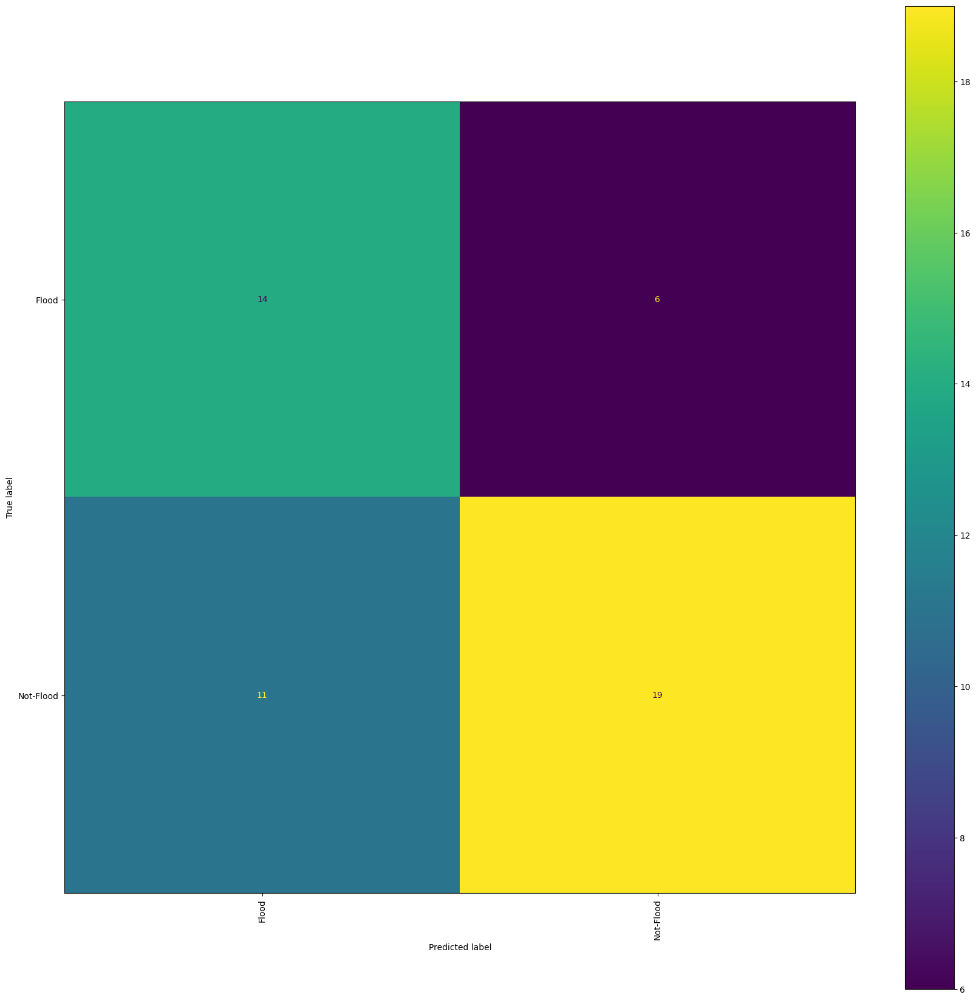

In [20]:
disp = ConfusionMatrixDisplay(cm, display_labels=uniq_labels)
# disp.plot()
# plt.show()

fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax=ax, xticks_rotation='vertical')